# Visualizations of the EEG data in the TF domain

This notebook is used for different basic visualisations in the TF domain

Author: Magnus Evensen, Malte Færgemann Lau $\\$
Project: Bachelor's Project - EEG Social Interaction

In [155]:
import h5py
import numpy as np
import mne
import os
import pandas as pd
import glob
import gc
from tqdm import tqdm

import matplotlib.pyplot as plt
import matplotlib as mpl

# mpl setup
mpl.rcParams['image.cmap'] = 'ocean'
plt.rcParams['axes.prop_cycle'] = plt.cycler(color=plt.cm.Set2(np.linspace(0, 1, 8)))
# plt.rcParams['axes.prop_cycle'] = plt.cycler(color = [(225/255,102/255,102/255), (82/255,158/255,205/255),  (194/255,226/255,170/255), (225/255,178/255,102/255), (178/255,102/255,225/255),(225/255,225/255,102/255),(102/255,102/255,225/255)])
mpl.rcParams['font.family'] = 'Helvetica Neue'
mpl.rcParams['figure.figsize'] = (6, 4)
mpl.rcParams['lines.linewidth'] = 1
mpl.rcParams['figure.dpi'] = 400
%config InlineBackend.figure_format = 'retina'
%matplotlib inline
dtu_colors = {'dtured' : (0.6,0,0), 'navyblue' : (0.0118,0.0588,0.3098), 'red' : (0.9098,0.2471,0.2824), 'blue': (0.1843,0.2431,0.9176), 'green' : (0,0.5333,0.2078), 'orange' : (0.9882,0.4627,0.2039), 'purple' : (0.4745,0.1373,0.5569), 'brightgreen' : (0.1216,0.8157,0.5098), 'yellow' : (0.9647,0.8157,0.3019), 'pink' : (0.9686,0.7333,0.6941), 'grey' : (0.8549,0.8549,0.8549), 'red' : (0.9098,0.2471,0.2824)}

In [2]:
path = os.path.abspath('../FG_Data/FG_overview_df_v2.pkl')
overview = pd.read_pickle(path)
overview

,Subject_id,Exp_id,Friend_status,EEG_device,Force_device,Force_port,Age,Gender,Class_friends,Class_close_friends,Friends,Close_friends,Triad_id,Participant,tFriends,tClose_friends,All_friends,tClass,rClass
0,1049,301A,Yes,1,1,1,22.239562,F,3,6,9,14,301,P1,12,20,32,9,0.666667
1,1029,301B,No,2,3,2,24.331280,M,3,1,8,5,301,P2,11,6,17,4,0.250000
2,1028,301C,Yes,3,4,3,21.670089,M,8,4,9,4,301,P3,17,8,25,12,0.333333
3,1064,302A,Yes,1,1,1,22.009582,M,14,8,11,5,302,P1,25,13,38,22,0.363636
4,1024,302B,Yes,2,3,2,21.355236,M,5,7,6,10,302,P2,11,17,28,12,0.583333
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
87,6069,330B,No,2,3,2,19.373032,F,14,3,17,17,330,P2,31,20,51,17,0.176471
88,6048,330C,Yes,3,4,3,19.841205,M,13,11,25,26,330,P3,38,37,75,24,0.458333
89,6015,331A,Yes,1,1,1,20.052019,M,9,4,14,13,331,P1,23,17,40,13,0.307692
90,6183,331B,Yes,2,3,2,18.863792,M,22,6,25,12,331,P2,47,18,65,28,0.214286


In [ ]:
# Create df for plots
folder_path = os.path.abspath('../FG_Data/PreprocessedEEGData')

# Use glob to find all FIF files in the folder
epoch_files = glob.glob(os.path.join(folder_path, '*-epo.fif'))
epochs_list = []
# Load each FIF file into a list of epoch objects
for f in epoch_files:
    # Extract participant ID from filename
    basename = os.path.basename(f)
    # For filenames like '301A_FG_preprocessed-epo.fif',
    # this splits into ['301A', 'FG', 'preprocessed-epo.fif']
    Exp_id = basename.split('_')[0]
    
    # Lookup gender in your DataFrame based on the participant_id
    gender = overview.loc[overview['Exp_id'] == Exp_id, 'Gender'].iloc[0]
    
    # Read the epochs
    epochs = mne.read_epochs(f, preload=False, verbose=False)
    
    # Store everything in a dictionary (or tuple) in the list
    epochs_list.append({
        'Exp_id': Exp_id,
        'Gender': gender,
        'Epochs': epochs
    })
epochs_df = pd.DataFrame(epochs_list)
sfreq = int(epochs_df['Epochs'][0].info['sfreq'])
n_epochs, n_channels, n_timepoints = epochs_df['Epochs'][0].get_data().shape
epochs_df

,Exp_id,Gender,Epochs
0,326A,M,"<EpochsFIF | 298 events (all good), -0.5 – 5...."
1,311A,M,"<EpochsFIF | 300 events (all good), -0.5 – 5...."
2,318B,F,"<EpochsFIF | 298 events (all good), -0.5 – 5...."
3,315A,F,"<EpochsFIF | 295 events (all good), -0.5 – 5...."
4,322A,F,"<EpochsFIF | 300 events (all good), -0.5 – 5...."
...,...,...,...
87,303C,M,"<EpochsFIF | 299 events (all good), -0.5 – 5...."
88,309A,F,"<EpochsFIF | 300 events (all good), -0.5 – 5...."
89,308B,F,"<EpochsFIF | 299 events (all good), -0.5 – 5...."
90,305A,M,"<EpochsFIF | 296 events (all good), -0.5 – 5...."


In [4]:
def roof(x):
    return int(x) + 1 if x > int(x) else int(x)

In [30]:
def get_psds_for_channel_for_all_participants(participants_data, channel, settings, window, freq_band = 'Unfiltered'):
    
    overlap = window / 2
    psd_dict = {}
    for setting in settings:
        all_psds = []
        for i, epochs in enumerate(tqdm(participants_data, desc=f'For condition: {setting}, for channel: {channel} with freq band: {freq_band}')):
            # Pick channel 
            filtered_epochs = epochs.load_data().pick([channel])
            band = [4,8] if freq_band=='Theta' else [8,12] if freq_band=='Alpha' else [12,35] if freq_band=='Theta' else False
            if band: # filter epochs to a certain frequency band
                filtered_epochs = filtered_epochs.filter(l_freq=band[0], h_freq=band[1], fir_design='firwin', n_jobs=10, verbose = False) 
            filtered_epochs = filtered_epochs[setting]
            
            powers = []
            for j in range(0,int(6/overlap-1)): # get segments and compute psd using welch transform 
                t0 = j*overlap - 0.5
                t = window + t0 - 1/sfreq
                segment = filtered_epochs.copy().crop(tmin = t0, tmax = t) # Get time segment from samples
                psds = segment.compute_psd(method='welch', fmin=1, fmax=40, n_fft=int(sfreq*window), n_overlap=int(sfreq*0.5*window), n_jobs=10, verbose = False); # what to do about frequency here?
                print(psds)
                mean_psds = psds.average()
                powers.append(mean_psds.get_data().mean(axis=1))
            
            powers = np.array(powers)
            baseline = powers[5:11,:].mean() # get baseline psd
            powers = powers/baseline # divide with baseline psd
            all_psds.append(powers)
            
            # Unload data from iteration to save memory space
            del filtered_epochs
            gc.collect()
            
        label = f'{setting}, {freq_band} frequencies, channel {channel}'
        psd_dict[label] = np.reshape(all_psds, (len(all_psds), len(all_psds[0]))) 
        
    return psd_dict

In [174]:
def get_psds_for_channel_for_all_participants(participants_data, channel, settings, window, freq_band = 'Unfiltered', overlap = 0.75):
    
    overlap = int(window * sfreq * overlap) # scale overlap to window size
    psd_dict = {}
    for setting in settings:
        all_psds = []
        for i, epochs in enumerate(tqdm(participants_data, desc=f'For condition: {setting}, for channel: {channel} with freq band: {freq_band}')):
            # Pick channel 
            filtered_epochs = epochs.copy().load_data().pick([channel])
            # Filter frequency band if wanted
            band = [4,8] if freq_band=='Theta' else [8,12] if freq_band=='Alpha' else [12,35] if freq_band=='Beta' else False
            if band: # filter epochs to a certain frequency band
                filtered_epochs = filtered_epochs.filter(l_freq=band[0], h_freq=band[1], fir_design='firwin', n_jobs=10, verbose = False) 
            
            filtered_epochs = filtered_epochs[setting]
            #filtered_epochs = filtered_epochs.apply_baseline(baseline=(-0.25,0))
            # Compute PSD
            psds = filtered_epochs.compute_psd(method='welch', window = 'hamming', average = None, fmin=band[0] if band else 1, fmax=band[1] if band else 40, n_fft=int(sfreq*window*2/band[0] if band else sfreq*window), n_overlap=int(overlap*2/band[0] if band else overlap), n_jobs=10, verbose = False); # what to do about frequency here?
            mean_psds = np.array(psds.get_data().mean(axis=0).mean(axis = 1)).flatten()
            # Standardize to baseline 
            baseline = mean_psds[int(len(mean_psds)/20):int(len(mean_psds)/10)].mean() 
            all_psds.append(mean_psds/baseline) # append the mean over epochs and frequencies to all psds

            # Unload data from iteration to save memory space
            del filtered_epochs
            gc.collect()
            
        label = f'{setting}, {freq_band} frequencies, channel {channel}'
        psd_dict[label] = np.reshape(all_psds, (len(all_psds), len(all_psds[0]))) 
        
    return psd_dict

In [ ]:
window = 1
channel = 'C3'
settings = ['T1P', 'T1Pn']
overlap = 0.9
psds = get_psds_for_channel_for_all_participants(participants_data=epochs_df['Epochs'], overlap=overlap, channel=channel, settings=settings, freq_band = "Alpha", window=window)

For condition: T1P, for channel: C3 with freq band: Alpha: 100%|██████████| 92/92 [00:46<00:00,  1.99it/s]
For condition: T1Pn, for channel: C3 with freq band: Alpha: 100%|██████████| 92/92 [00:44<00:00,  2.07it/s]


In [180]:
def plot_TF(dict, mean = False, window = 1, overlay = True): 
    """ Takes a dict where each value should be of size (n_segments, n_channels), \\
    and returns frequency over time plots in a (n_items, 2) grid"""
    times = np.linspace(-0.5, 5.5, len(next(iter(dict.values()))[0])) #+  window*sfreq/2/len(next(iter(dict.values()))[0]) # Create time points equal to powers
    
    if overlay: 
        fig, ax = plt.subplots(1,1, figsize= (12,6))
    else: 
        fig, axes = plt.subplots(roof(len(dict)/2), 2, figsize=(12, len(dict)*2), constrained_layout = True)
        axes = axes.flatten()
    
    
    for i, (data_label, powers) in enumerate(dict.items()):
        if not overlay:
            ax = axes[i]
        if mean: # Plot mean with std
            mean_line = np.mean(powers, axis = 0)
            std_line = np.std(powers, axis = 0)/np.sqrt(len(powers))
            ax.plot(times, mean_line, label = data_label)
            ax.fill_between(times, mean_line - std_line, mean_line + std_line, alpha=0.3)
        
        else: # Plot each participant
            for power in powers:
                ax.plot(times, power, alpha = 0.5)
        if not overlay: 
            ax.axhline(y=1, color='black', linestyle='--', label='baseline', alpha = 0.3) # plot baseline
            ax.set_title(f"{data_label}")
            ax.set_ylim(0.55,1.35)
            ax.set_xlim(-0.1,4)
            ax.set_xlabel('Time (s)')
            ax.set_ylabel('Power')
    if overlay:
        ax.axhline(y=1, color='black', linestyle='--', label='baseline', alpha = 0.3) # plot baseline
        ax.set_title("Power spectrum densities")
        ax.set_ylim(0.55,1.35)
        ax.set_xlim(-0.1,4)
        ax.set_xlabel('Time (s)')
        ax.set_ylabel('Power')
        ax.legend()
    plt.show()

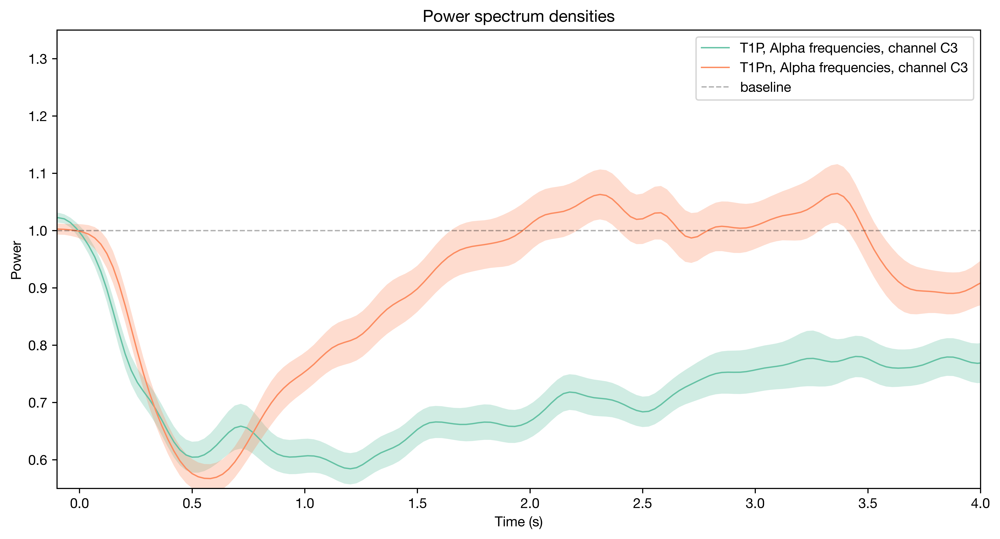

In [171]:
plot_TF(psds, mean=True)

In [ ]:
window = 1 # What should window size be?
overlap = 0.9
settings = ['T1P', 'T1Pn', 'T3P', 'T3Pn']
channel = 'C3'
Alpha_psds = get_psds_for_channel_for_all_participants(participants_data=epochs_df['Epochs'], channel=channel, settings=settings, freq_band = "Alpha", window=window, overlap = overlap)
Beta_psds = get_psds_for_channel_for_all_participants(participants_data=epochs_df['Epochs'], channel=channel, settings=settings, freq_band = "Beta", window=window, overlap = overlap)
Theta_psds = get_psds_for_channel_for_all_participants(participants_data=epochs_df['Epochs'], channel=channel, settings=settings, freq_band = "Theta", window=window, overlap = overlap)
unfiltered_psds = get_psds_for_channel_for_all_participants(participants_data=epochs_df['Epochs'], channel=channel, settings=settings, freq_band = 'Unfiltered', window=window, overlap = overlap)

For condition: T1P, for channel: C3 with freq band: Alpha: 100%|██████████| 92/92 [00:52<00:00,  1.74it/s]
For condition: T1Pn, for channel: C3 with freq band: Alpha: 100%|██████████| 92/92 [00:44<00:00,  2.05it/s]
For condition: T3P, for channel: C3 with freq band: Alpha: 100%|██████████| 92/92 [00:43<00:00,  2.11it/s]
For condition: T3Pn, for channel: C3 with freq band: Alpha: 100%|██████████| 92/92 [00:42<00:00,  2.15it/s]
For condition: T1P, for channel: C3 with freq band: Beta: 100%|██████████| 92/92 [00:43<00:00,  2.11it/s]
For condition: T1Pn, for channel: C3 with freq band: Beta: 100%|██████████| 92/92 [00:43<00:00,  2.11it/s]
For condition: T3P, for channel: C3 with freq band: Beta: 100%|██████████| 92/92 [00:47<00:00,  1.93it/s]
For condition: T3Pn, for channel: C3 with freq band: Beta: 100%|██████████| 92/92 [00:43<00:00,  2.13it/s]
For condition: T1P, for channel: C3 with freq band: Theta: 100%|██████████| 92/92 [00:43<00:00,  2.13it/s]
For condition: T1Pn, for channel: C3 

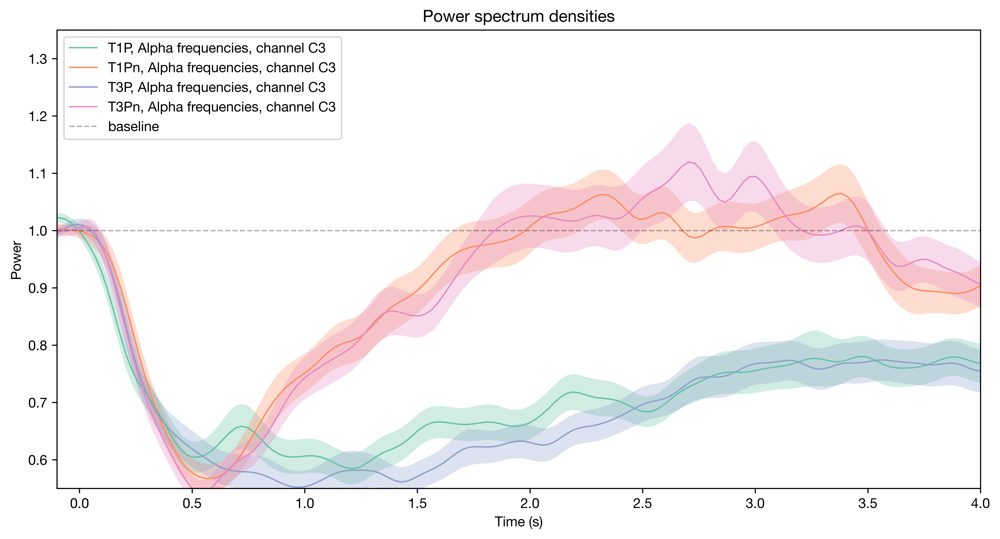

In [182]:
plot_TF(Alpha_psds, mean = True)

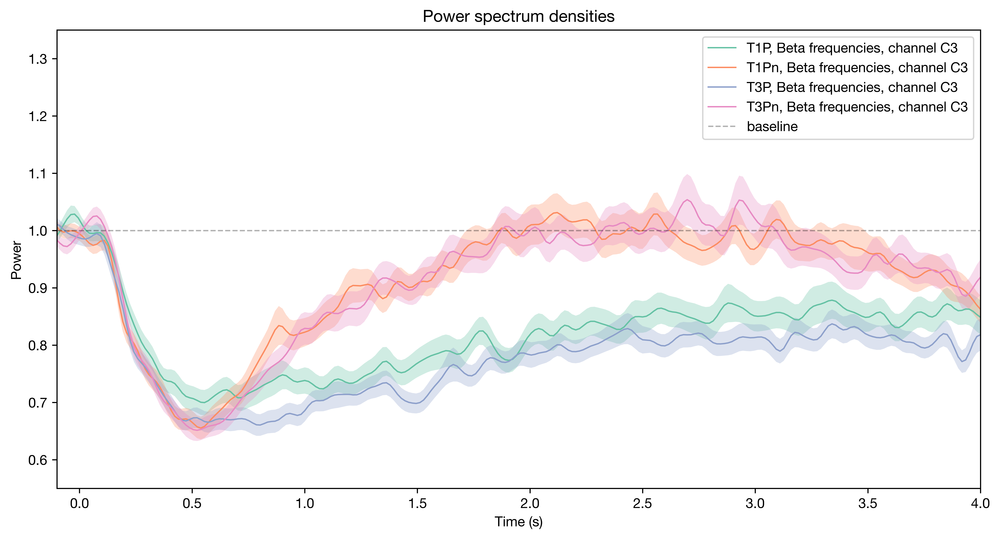

In [181]:
plot_TF(Beta_psds, mean = True)

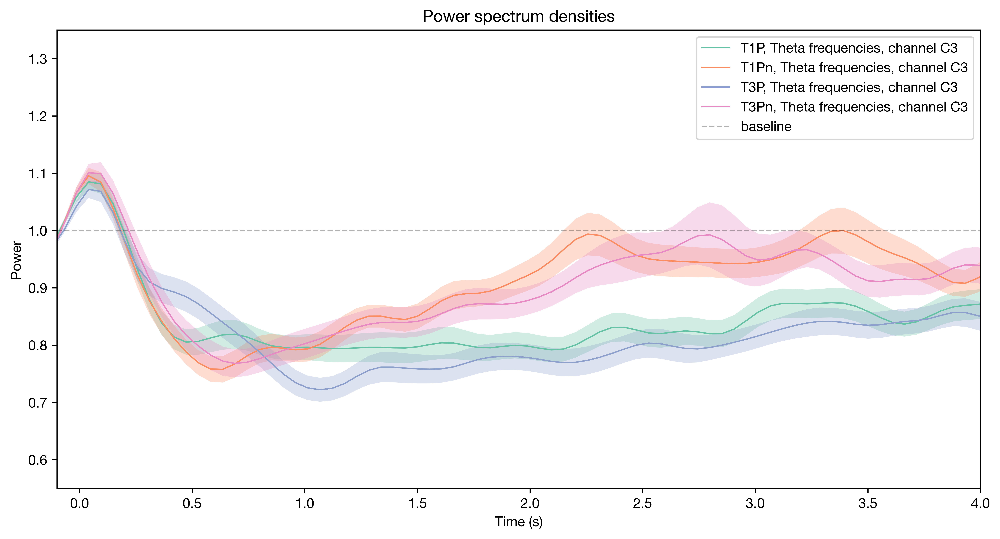

In [178]:
plot_TF(Theta_psds, mean = True)

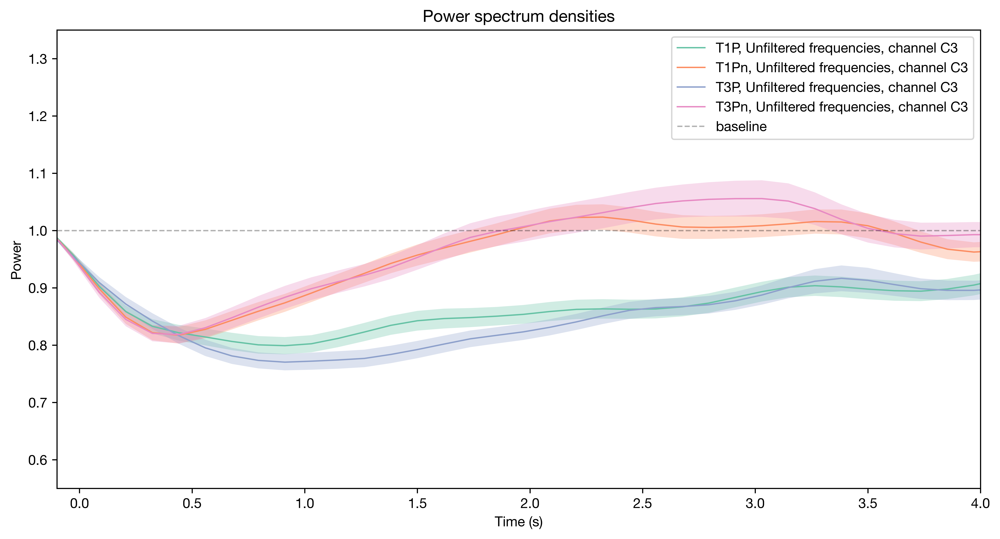

In [179]:
plot_TF(unfiltered_psds, mean = True)

In [240]:
window = 1 # What should window size be?
overlap = 0.9
settings = ['T1P', 'T1Pn']
channel = 'C3'
psds = get_psds_for_channel_for_all_participants(participants_data=epochs_df.loc[epochs_df['Gender'] == 'M', 'Epochs'], channel=channel, settings=settings, freq_band = "Alpha", window=window, overlap = overlap)
M_psds = {'Male, ' + old_key: old_value for old_key, old_value in psds.items()}
psds = get_psds_for_channel_for_all_participants(participants_data=epochs_df.loc[epochs_df['Gender'] == 'F', 'Epochs'], channel=channel, settings=settings, freq_band = "Alpha", window=window, overlap = overlap)
F_psds = {'Female, ' + old_key: old_value for old_key, old_value in psds.items()}
FM_T1Ps_alpha = M_psds | F_psds
psds = get_psds_for_channel_for_all_participants(participants_data=epochs_df.loc[epochs_df['Gender'] == 'M', 'Epochs'], channel=channel, settings=settings, freq_band = "Theta", window=window, overlap = overlap)
M_psds = {'Male, ' + old_key: old_value for old_key, old_value in psds.items()}
psds = get_psds_for_channel_for_all_participants(participants_data=epochs_df.loc[epochs_df['Gender'] == 'F', 'Epochs'], channel=channel, settings=settings, freq_band = "Theta", window=window, overlap = overlap)
F_psds = {'Female, ' + old_key: old_value for old_key, old_value in psds.items()}
FM_T1Ps_Theta = M_psds | F_psds
psds = get_psds_for_channel_for_all_participants(participants_data=epochs_df.loc[epochs_df['Gender'] == 'M', 'Epochs'], channel=channel, settings=settings, freq_band = "Beta", window=window, overlap = overlap)
M_psds = {'Male, ' + old_key: old_value for old_key, old_value in psds.items()}
psds = get_psds_for_channel_for_all_participants(participants_data=epochs_df.loc[epochs_df['Gender'] == 'F', 'Epochs'], channel=channel, settings=settings, freq_band = "Beta", window=window, overlap = overlap)
F_psds = {'Female, ' + old_key: old_value for old_key, old_value in psds.items()}
FM_T1Ps_Beta = M_psds | F_psds

For condition: T1P, for channel: C3 with freq band: Alpha: 100%|██████████| 58/58 [00:45<00:00,  1.26it/s]
For condition: T1Pn, for channel: C3 with freq band: Alpha: 100%|██████████| 58/58 [00:32<00:00,  1.81it/s]
For condition: T1P, for channel: C3 with freq band: Alpha: 100%|██████████| 34/34 [00:19<00:00,  1.75it/s]
For condition: T1Pn, for channel: C3 with freq band: Alpha: 100%|██████████| 34/34 [00:18<00:00,  1.83it/s]
For condition: T1P, for channel: C3 with freq band: Theta: 100%|██████████| 58/58 [00:32<00:00,  1.78it/s]
For condition: T1Pn, for channel: C3 with freq band: Theta: 100%|██████████| 58/58 [00:31<00:00,  1.82it/s]
For condition: T1P, for channel: C3 with freq band: Theta: 100%|██████████| 34/34 [00:18<00:00,  1.82it/s]
For condition: T1Pn, for channel: C3 with freq band: Theta: 100%|██████████| 34/34 [00:18<00:00,  1.82it/s]
For condition: T1P, for channel: C3 with freq band: Beta: 100%|██████████| 58/58 [00:32<00:00,  1.80it/s]
For condition: T1Pn, for channel: 

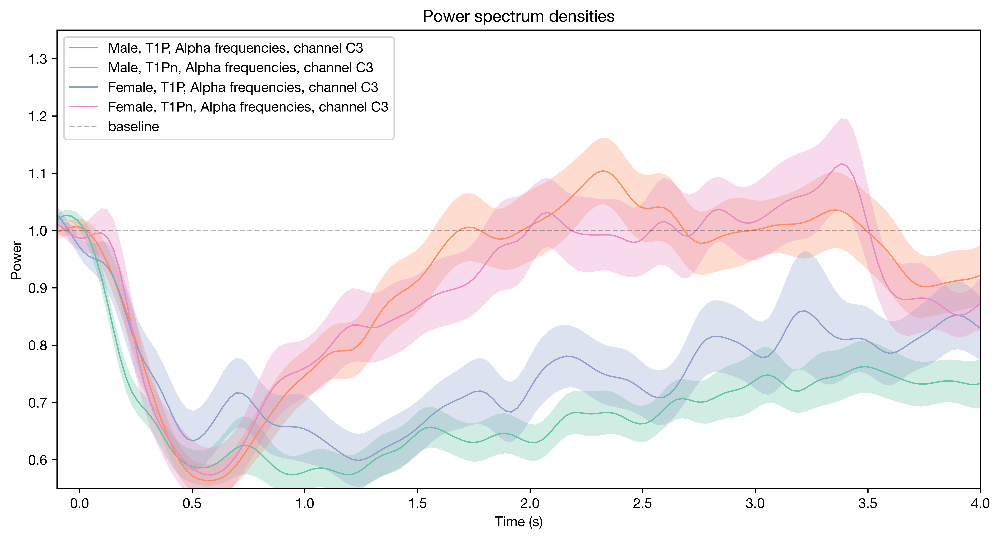

In [241]:
plot_TF(FM_T1Ps_alpha,mean=True)


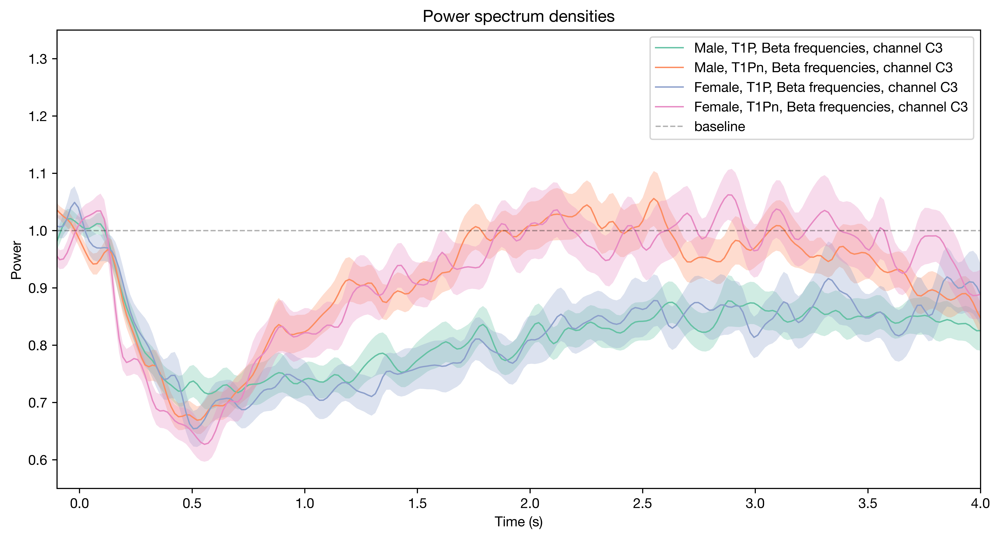

In [242]:
plot_TF(FM_T1Ps_Beta,mean=True)

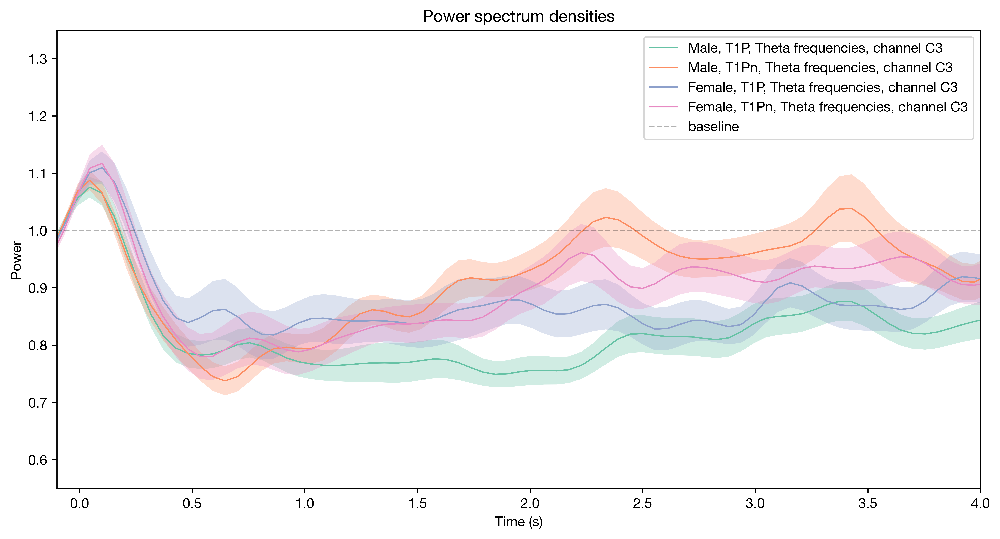

In [243]:
plot_TF(FM_T1Ps_Theta,mean=True)

In [235]:
window = 1 # What should window size be?
overlap = 0.9
settings = ['T3P', 'T3Pn']
channel = 'C3'
psds = get_psds_for_channel_for_all_participants(participants_data=epochs_df.loc[epochs_df['Gender'] == 'M', 'Epochs'], channel=channel, settings=settings, freq_band = "Alpha", window=window, overlap = overlap)
M_psds = {'Male, ' + old_key: old_value for old_key, old_value in psds.items()}
psds = get_psds_for_channel_for_all_participants(participants_data=epochs_df.loc[epochs_df['Gender'] == 'F', 'Epochs'], channel=channel, settings=settings, freq_band = "Alpha", window=window, overlap = overlap)
F_psds = {'Female, ' + old_key: old_value for old_key, old_value in psds.items()}
FM_T3Ps_alpha = M_psds | F_psds
psds = get_psds_for_channel_for_all_participants(participants_data=epochs_df.loc[epochs_df['Gender'] == 'M', 'Epochs'], channel=channel, settings=settings, freq_band = "Theta", window=window, overlap = overlap)
M_psds = {'Male, ' + old_key: old_value for old_key, old_value in psds.items()}
psds = get_psds_for_channel_for_all_participants(participants_data=epochs_df.loc[epochs_df['Gender'] == 'F', 'Epochs'], channel=channel, settings=settings, freq_band = "Theta", window=window, overlap = overlap)
F_psds = {'Female, ' + old_key: old_value for old_key, old_value in psds.items()}
FM_T3Ps_Theta = M_psds | F_psds
psds = get_psds_for_channel_for_all_participants(participants_data=epochs_df.loc[epochs_df['Gender'] == 'M', 'Epochs'], channel=channel, settings=settings, freq_band = "Beta", window=window, overlap = overlap)
M_psds = {'Male, ' + old_key: old_value for old_key, old_value in psds.items()}
psds = get_psds_for_channel_for_all_participants(participants_data=epochs_df.loc[epochs_df['Gender'] == 'F', 'Epochs'], channel=channel, settings=settings, freq_band = "Beta", window=window, overlap = overlap)
F_psds = {'Female, ' + old_key: old_value for old_key, old_value in psds.items()}
FM_T3Ps_Beta = M_psds | F_psds

For condition: T3P, for channel: C3 with freq band: Alpha:  98%|█████████▊| 57/58 [18:10<05:17, 317.79s/it]/Users/Magnus/miniconda3/envs/labram/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(
For condition: T3P, for channel: C3 with freq band: Alpha: 100%|██████████| 58/58 [18:16<00:00, 18.91s/it] 
For condition: T3Pn, for channel: C3 with freq band: Alpha: 100%|██████████| 58/58 [1:43:19<00:00, 106.89s/it]  
For condition: T3P, for channel: C3 with freq band: Alpha: 100%|██████████| 34/34 [00:18<00:00,  1.82it/s]
For condition: T3Pn, for channel: C3 with freq band: Alpha: 100%|██████████| 34/34 [00:18<00:00,  1.85it/s]
For condition: T3P, for channel: C3 with freq band: Theta: 100%|██████████| 58/58 [07:03<00:00,  7.31s/it]  
For condition: T3Pn, for channel: C3 with freq band: Theta: 100%|█████████

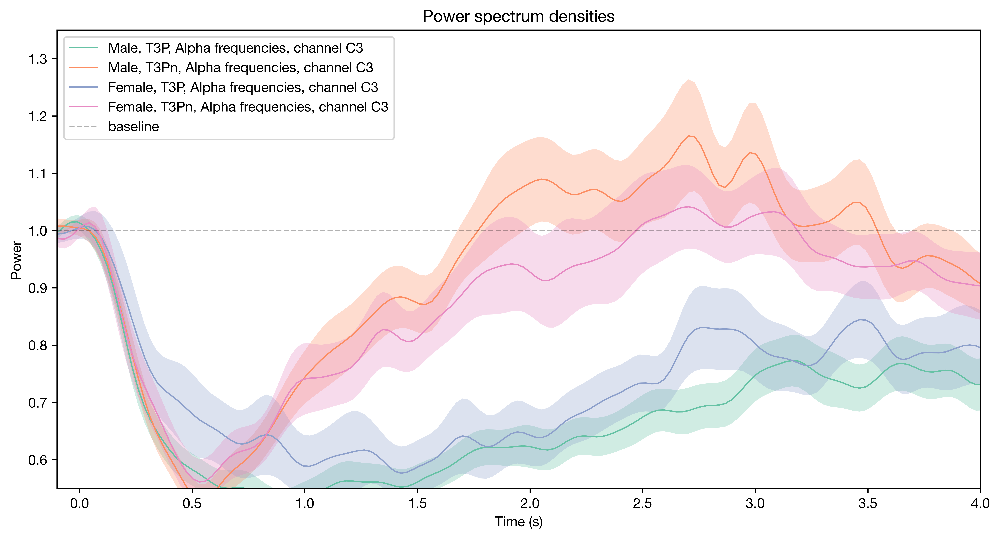

In [237]:
plot_TF(FM_T3Ps_alpha,mean=True)

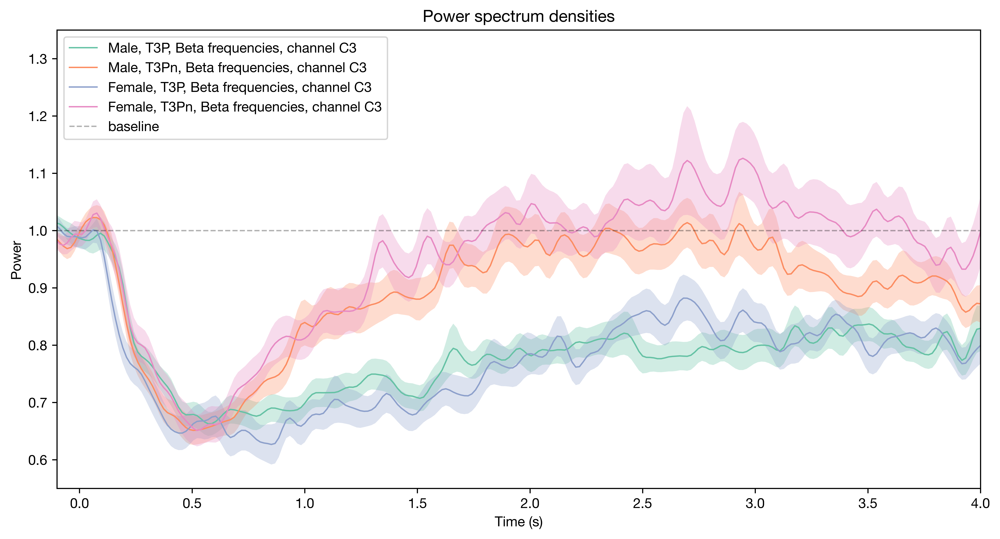

In [238]:
plot_TF(FM_T3Ps_Beta,mean=True)

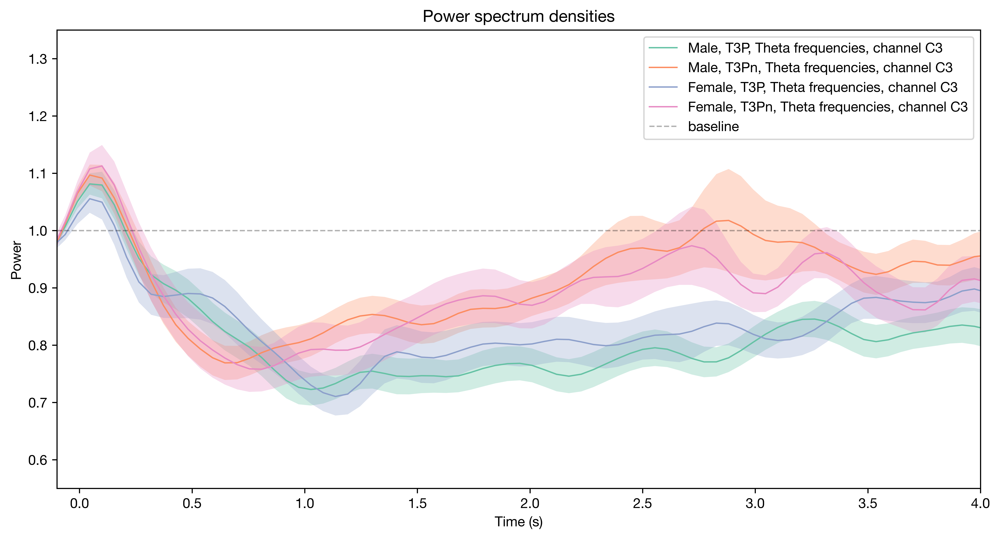

In [239]:
plot_TF(FM_T3Ps_Theta, mean = True)